In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [2]:
import matplotlib.pyplot as plt
import warnings

plt.style.use('seaborn')
plt.rcParams['figure.figsize'] = [8, 4.5]
plt.rcParams['figure.dpi'] = 300
warnings.simplefilter(action='ignore', category=FutureWarning)

# Identifying Credit Card Default with Machine Learning

## BONUS: Getting the data and preparing for book

This is a part not covered in the book. We download the considered dataset from the website of the [UC Irvine Machine Learning Repository](https://archive.ics.uci.edu/ml/datasets/default+of+credit+card+clients). The dataset originally does not contain missing values and the categorical variables are already encoded as numbers. To show the entire pipeline of working and preparing potentially messy data, we apply some transformations:

* we encoded the gender, education and marital status related variables to strings
* we introduced missing values to some observations (0.5% of the entire sample, selected randomly per column - the total percentage of rows with at least one missing value will be higher)
* some observed values for features such as level of education, payment status, etc. are outside of the range of possible categories defined by the authors. As this problem affects many observations, we encode new, undescribed categories as either 'Others' (when there was already such a category) or 'Unknown' (in the case of payment status).

The reason for selecting only a small fraction of values to be missing is that we do not want to significantly change the underlying structure/patterns in the data.

In [3]:
import pandas as pd
import numpy as np
import random

In [4]:
# downloading the data 
#!wget https://archive.ics.uci.edu/ml/machine-learning-databases/00350/default%20of%20credit%20card%20clients.xls

In [ ]:
df = pd.read_excel('default of credit card clients.xls', skiprows=1, index_col=0)

In [ ]:
# loading the data from Excel
df = pd.read_excel('default of credit card clients.xls', skiprows=1, index_col=0)

# rename columns
df.columns = df.columns.str.lower().str.replace(" ", "_")

months = ['sep', 'aug', 'jul', 'jun', 'may', 'apr']
variables = ['payment_status', 'bill_statement', 'previous_payment']
new_column_names = [x + '_' + y for x in variables for y in months]
rename_dict = {x: y for x, y in zip(df.loc[:, 'pay_0':'pay_amt6'].columns, new_column_names)}
df.rename(columns=rename_dict, inplace=True)


# creating dicts to map number to strings
gender_dict = {1: 'Male', 
               2: 'Female'}
education_dict = {0: 'Others',
                  1: 'Graduate school', 
                  2: 'University', 
                  3: 'High school', 
                  4: 'Others',
                  5: 'Others',
                  6: 'Others'}
marital_status_dict = {0: 'Others', 
                       1: 'Married', 
                       2: 'Single', 
                       3: 'Others'}
payment_status = {-2: 'Unknown',
                  -1: 'Payed duly',
                  0: 'Unknown',
                  1: 'Payment delayed 1 month',
                  2: 'Payment delayed 2 months',
                  3: 'Payment delayed 3 months',
                  4: 'Payment delayed 4 months',
                  5: 'Payment delayed 5 months',
                  6: 'Payment delayed 6 months',
                  7: 'Payment delayed 7 months',
                  8: 'Payment delayed 8 months',
                  9: 'Payment delayed >= 9 months'}

# # map numbers to strings
df.sex = df.sex.map(gender_dict)
df.education = df.education.map(education_dict)
df.marriage = df.marriage.map(marital_status_dict)

for column in [x for x in df.columns if ('status' in x)]:
    df[column] = df[column].map(payment_status)

# define the ratio of missing values to introduce
RATIO_MISSING = 0.005

# input missing values to selected columns
random_state = np.random.RandomState(42)
for column in ['sex', 'education', 'marriage', 'age']:
    df.loc[df.sample(frac=RATIO_MISSING, random_state=random_state).index, column] = ''

# reset index
df.reset_index(drop=True, inplace=True)

# save to csv
df.to_csv('credit_card_default.csv')

## Loading the data and managing data types

### How to do it...

1. Import the libraries:

In [3]:
import pandas as pd

2. Preview the CSV file:

In [4]:
!head -n 5 credit_card_default.csv

,limit_bal,sex,education,marriage,age,payment_status_sep,payment_status_aug,payment_status_jul,payment_status_jun,payment_status_may,payment_status_apr,bill_statement_sep,bill_statement_aug,bill_statement_jul,bill_statement_jun,bill_statement_may,bill_statement_apr,previous_payment_sep,previous_payment_aug,previous_payment_jul,previous_payment_jun,previous_payment_may,previous_payment_apr,default_payment_next_month
0,20000,Female,University,Married,24,Payment delayed 2 months,Payment delayed 2 months,Payed duly,Payed duly,Unknown,Unknown,3913,3102,689,0,0,0,0,689,0,0,0,0,1
1,120000,Female,University,Single,26,Payed duly,Payment delayed 2 months,Unknown,Unknown,Unknown,Payment delayed 2 months,2682,1725,2682,3272,3455,3261,0,1000,1000,1000,0,2000,1
2,90000,Female,University,Single,34,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,29239,14027,13559,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
3,50000,Female,University,Married,37,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,46990

3. Load the data from the CSV file:

In [5]:
df = pd.read_csv('credit_card_default.csv', index_col=0, na_values='')
print(f'The DataFrame has {len(df)} rows and {df.shape[1]} columns.')
df.head()

The DataFrame has 30000 rows and 24 columns.


,limit_bal,sex,education,marriage,age,payment_status_sep,payment_status_aug,payment_status_jul,payment_status_jun,payment_status_may,...,bill_statement_jun,bill_statement_may,bill_statement_apr,previous_payment_sep,previous_payment_aug,previous_payment_jul,previous_payment_jun,previous_payment_may,previous_payment_apr,default_payment_next_month
0,20000,Female,University,Married,24.0,Payment delayed 2 months,Payment delayed 2 months,Payed duly,Payed duly,Unknown,...,0,0,0,0,689,0,0,0,0,1
1,120000,Female,University,Single,26.0,Payed duly,Payment delayed 2 months,Unknown,Unknown,Unknown,...,3272,3455,3261,0,1000,1000,1000,0,2000,1
2,90000,Female,University,Single,34.0,Unknown,Unknown,Unknown,Unknown,Unknown,...,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
3,50000,Female,University,Married,37.0,Unknown,Unknown,Unknown,Unknown,Unknown,...,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
4,50000,Male,University,Married,57.0,Payed duly,Unknown,Payed duly,Unknown,Unknown,...,20940,19146,19131,2000,36681,10000,9000,689,679,0


4. Separate the features from the target:

In [6]:
X = df.copy()
y = X.pop('default_payment_next_month')

### There's more

In [7]:
df.dtypes

limit_bal                       int64
sex                            object
education                      object
marriage                       object
age                           float64
payment_status_sep             object
payment_status_aug             object
payment_status_jul             object
payment_status_jun             object
payment_status_may             object
payment_status_apr             object
bill_statement_sep              int64
bill_statement_aug              int64
bill_statement_jul              int64
bill_statement_jun              int64
bill_statement_may              int64
bill_statement_apr              int64
previous_payment_sep            int64
previous_payment_aug            int64
previous_payment_jul            int64
previous_payment_jun            int64
previous_payment_may            int64
previous_payment_apr            int64
default_payment_next_month      int64
dtype: object

In [8]:
def get_df_memory_usage(df, top_columns=5):
    '''
    Function for quick analysis of a pandas DataFrame's memory usage.
    It prints the top `top_columns` columns in terms of memory usage 
    and the total usage of the DataFrame.
    
    Parameters
    ------------
    df : pd.DataFrame
        DataFrame to be inspected
    top_columns : int
        Number of top columns (in terms of memory used) to display
    '''
    print('Memory usage ----')
    memory_per_column = df.memory_usage(deep=True) / 1024 ** 2
    print(f'Top {top_columns} columns by memory (MB):')
    print(memory_per_column.sort_values(ascending=False) \
                           .head(top_columns))
    print(f'Total size: {memory_per_column.sum():.4f} MB')

In [9]:
get_df_memory_usage(df, 5)

Memory usage ----
Top 5 columns by memory (MB):
education             1.965001
payment_status_sep    1.954342
payment_status_aug    1.920288
payment_status_jul    1.916343
payment_status_jun    1.904229
dtype: float64
Total size: 20.7012 MB


In [10]:
df_cat = df.copy()
object_columns = df_cat.select_dtypes(include='object').columns
df_cat[object_columns] = df_cat[object_columns].astype('category')

In [11]:
get_df_memory_usage(df_cat)

Memory usage ----
Top 5 columns by memory (MB):
default_payment_next_month    0.228882
bill_statement_may            0.228882
limit_bal                     0.228882
age                           0.228882
previous_payment_apr          0.228882
dtype: float64
Total size: 3.9266 MB


In [12]:
column_dtypes = {'education': 'category', 
                 'marriage': 'category', 
                 'sex': 'category',
                 'payment_status_sep': 'category', 
                 'payment_status_aug': 'category', 
                 'payment_status_jul': 'category',       
                 'payment_status_jun': 'category', 
                 'payment_status_may': 'category', 
                 'payment_status_apr': 'category'}
df_cat2 = pd.read_csv('credit_card_default.csv', index_col=0, 
                      na_values='', dtype=column_dtypes)

In [13]:
get_df_memory_usage(df_cat2)

Memory usage ----
Top 5 columns by memory (MB):
default_payment_next_month    0.228882
bill_statement_may            0.228882
limit_bal                     0.228882
age                           0.228882
previous_payment_apr          0.228882
dtype: float64
Total size: 3.9265 MB


In [14]:
df_cat.equals(df_cat2)

True

## Exploratory Data Analysis

### How to do it...

1. Import the libraries:

In [15]:
import pandas as pd
import seaborn as sns
import numpy as np
import plotly.express as px
import plotly.io as pio

2. Get summary statistics for numeric variables:

In [18]:
df.describe().transpose().round(2)

,count,mean,std,min,25%,50%,75%,max
limit_bal,30000.0,167484.32,129747.66,10000.0,50000.00,140000.0,240000.00,1000000.0
age,29850.0,35.49,9.22,21.0,28.00,34.0,41.00,79.0
bill_statement_sep,30000.0,51223.33,73635.86,-165580.0,3558.75,22381.5,67091.00,964511.0
bill_statement_aug,30000.0,49179.08,71173.77,-69777.0,2984.75,21200.0,64006.25,983931.0
bill_statement_jul,30000.0,47013.15,69349.39,-157264.0,2666.25,20088.5,60164.75,1664089.0
bill_statement_jun,30000.0,43262.95,64332.86,-170000.0,2326.75,19052.0,54506.00,891586.0
bill_statement_may,30000.0,40311.40,60797.16,-81334.0,1763.00,18104.5,50190.50,927171.0
bill_statement_apr,30000.0,38871.76,59554.11,-339603.0,1256.00,17071.0,49198.25,961664.0
previous_payment_sep,30000.0,5663.58,16563.28,0.0,1000.00,2100.0,5006.00,873552.0
previous_payment_aug,30000.0,5921.16,23040.87,0.0,833.00,2009.0,5000.00,1684259.0


3. Get summary statistics for categorical variables:

In [19]:
df.describe(include='object').transpose()

,count,unique,top,freq
sex,29850,2,Female,18027
education,29850,4,University,13960
marriage,29850,3,Single,15891
payment_status_sep,30000,10,Unknown,17496
payment_status_aug,30000,10,Unknown,19512
payment_status_jul,30000,10,Unknown,19849
payment_status_jun,30000,10,Unknown,20803
payment_status_may,30000,9,Unknown,21493
payment_status_apr,30000,9,Unknown,21181


4. Plot the distribution of age and split it by gender:

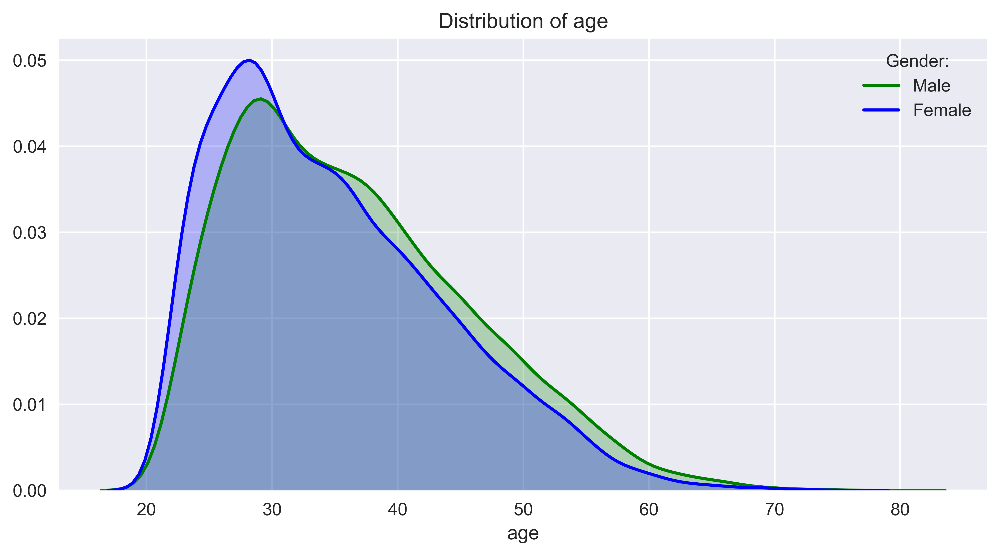

In [20]:
fig, ax = plt.subplots()
sns.distplot(df.loc[df.sex=='Male', 'age'].dropna(), 
             hist=False, color='green', 
             kde_kws={'shade': True},
             ax=ax, label='Male')
sns.distplot(df.loc[df.sex=='Female', 'age'].dropna(), 
             hist=False, color='blue', 
             kde_kws={'shade': True},
             ax=ax, label='Female')
ax.set_title('Distribution of age')
ax.legend(title='Gender:')

plt.tight_layout()
# plt.savefig('images/ch8_im5.png')
plt.show()

As mentioned in the text, we can create a histogram (together with the KDE), by calling:

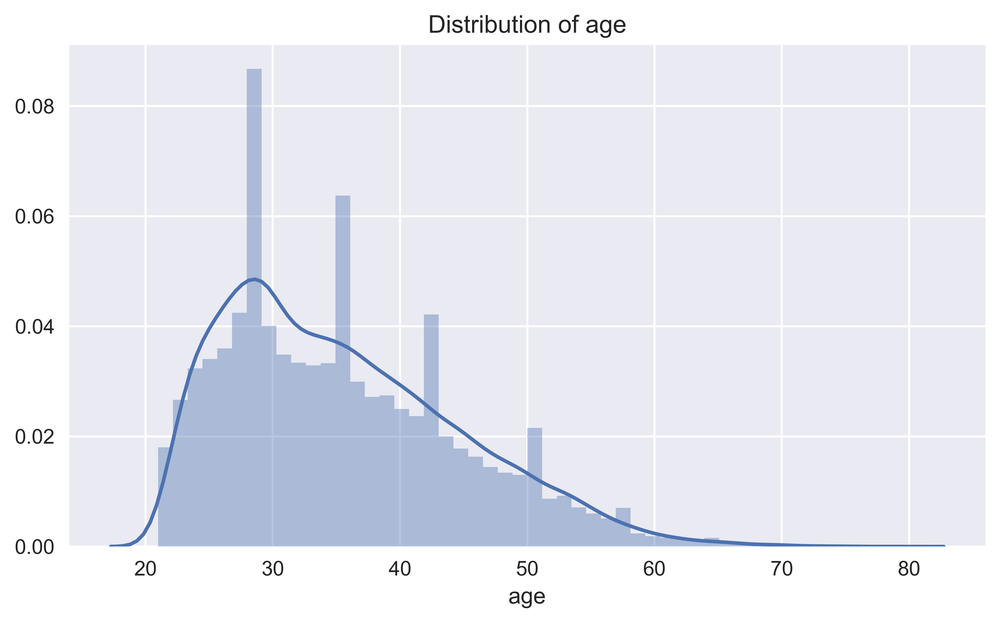

In [21]:
ax = sns.distplot(df.age.dropna(), )
ax.set_title('Distribution of age');

We noticed some spikes appearing every ~10 years and the reason for this is the binning. Below, we created the same histogram using `sns.countplot` and `plotly_express`. By doing so, each value of age has a separate bin and we can inspect the plot in detail. There are no such spikes in the following plots:

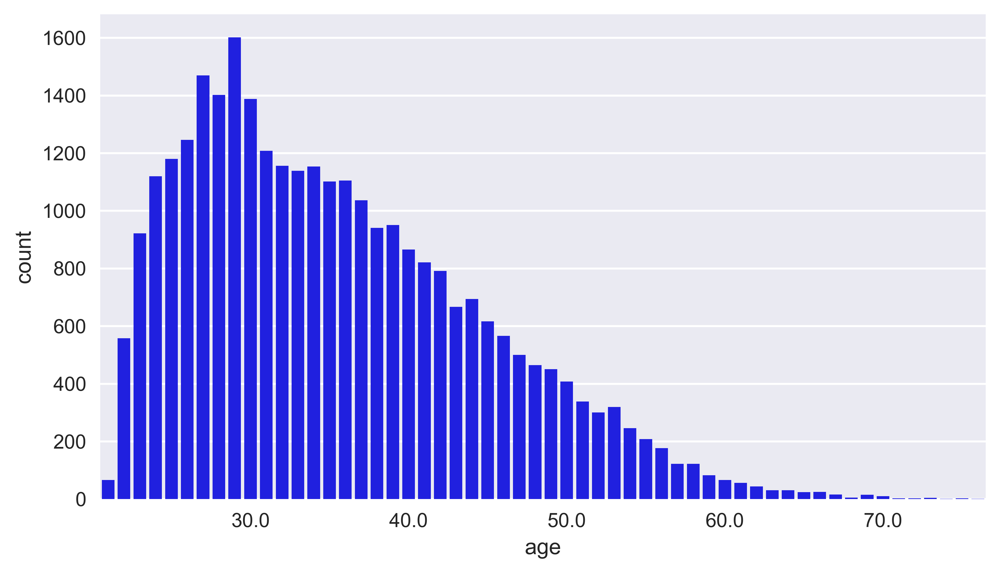

In [22]:
plot_ = sns.countplot(x=df.age.dropna(), color='blue')

for ind, label in enumerate(plot_.get_xticklabels()):
    if int(float(label.get_text())) % 10 == 0:
        label.set_visible(True)
    else:
        label.set_visible(False)

In [24]:
px.histogram(df, x='age', title = 'Distribution of age')

5. Plot a `pairplot` of selected variables:

/Users/eryklewinson/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning:

invalid value encountered in greater_equal

/Users/eryklewinson/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning:

invalid value encountered in less_equal



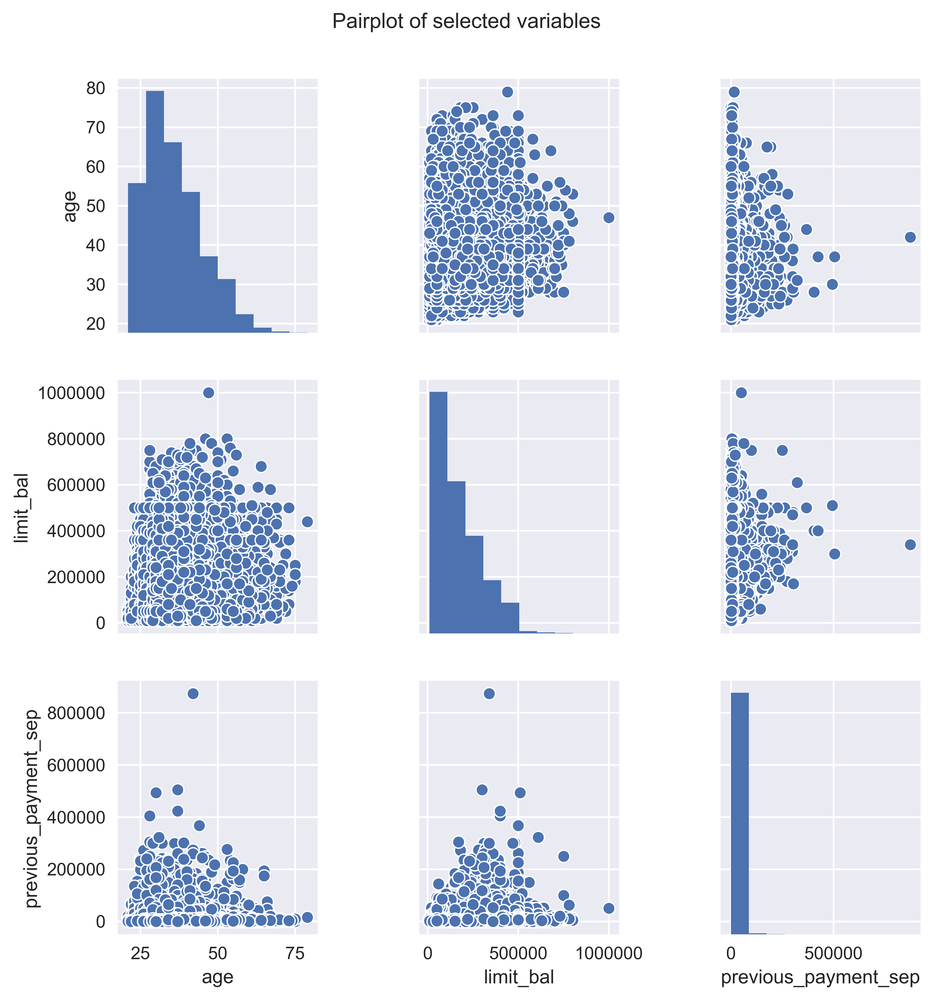

In [23]:
pair_plot = sns.pairplot(df[['age', 'limit_bal', 'previous_payment_sep']])
pair_plot.fig.suptitle('Pairplot of selected variables', y=1.05)

plt.tight_layout()
# plt.savefig('images/ch8_im6.png', bbox_inches='tight')
plt.show()

Additionally, we can separate the genders by specifying the `hue` argument:

In [18]:
# pair_plot = sns.pairplot(df[['sex', 'age', 'limit_bal', 'previous_payment_sep']], 
#                          hue='sex')
# pair_plot.fig.suptitle('Pairplot of selected variables', y=1.05);

6. Define and run a function for plotting the correlation heatmap:

In [25]:
def plot_correlation_matrix(corr_mat):
    '''
    Function for plotting the correlation heatmap. It masks the irrelevant fields.
    
    Parameters
    ----------
    corr_mat : pd.DataFrame
        Correlation matrix of the features.
    '''
    
    # temporarily change style
    sns.set(style='white')
    # mask the upper triangle
    mask = np.zeros_like(corr_mat, dtype=np.bool)
    mask[np.triu_indices_from(mask)] = True
    # set up the matplotlib figure
    fig, ax = plt.subplots()
    # set up custom diverging colormap
    cmap = sns.diverging_palette(240, 10, n=9, as_cmap=True)
    # plot the heatmap
    sns.heatmap(corr_mat, mask=mask, cmap=cmap, vmax=.3, center=0,
                square=True, linewidths=.5, 
                cbar_kws={'shrink': .5}, ax=ax)
    ax.set_title('Correlation Matrix', fontsize=16)
    # change back to darkgrid style
    sns.set(style='darkgrid')

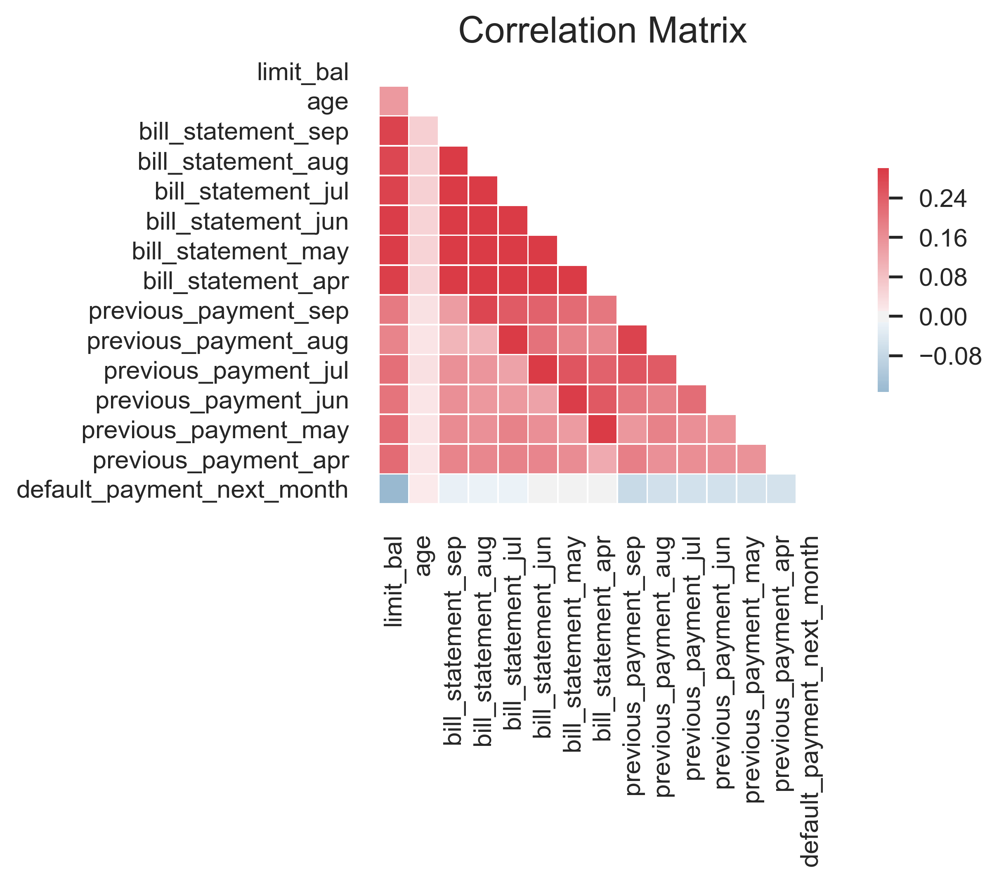

In [36]:
corr_mat = df.select_dtypes(include='number').corr()    
plot_correlation_matrix(corr_mat)

plt.tight_layout()
#plt.savefig('images/ch8_im7.png')
plt.show()

We can also directly inspect the correlation between the features (numerical) and the target:

In [26]:
df.select_dtypes(include='number').corr()[['default_payment_next_month']]

,default_payment_next_month
limit_bal,-0.153520
age,0.014491
bill_statement_sep,-0.019644
bill_statement_aug,-0.014193
bill_statement_jul,-0.014076
bill_statement_jun,-0.010156
bill_statement_may,-0.006760
bill_statement_apr,-0.005372
previous_payment_sep,-0.072929
previous_payment_aug,-0.058579


7. Plot the distribution of limit balance for each gender and education level:

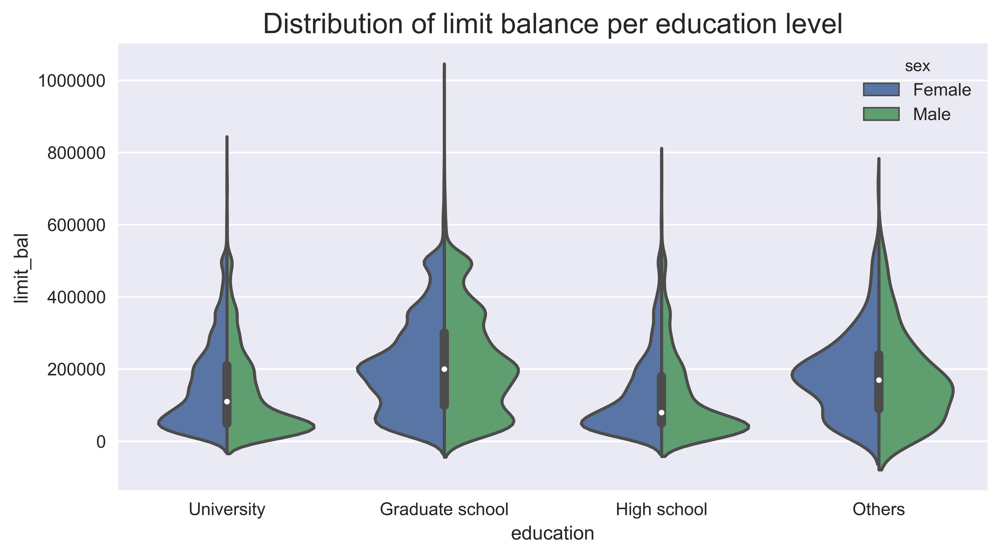

In [27]:
ax = sns.violinplot(x='education', y='limit_bal', 
                    hue='sex', split=True, data=df)
ax.set_title('Distribution of limit balance per education level', 
             fontsize=16)

plt.tight_layout()
# plt.savefig('images/ch8_im8.png')
plt.show()

The following code plots the same information, without splitting the violin plots.

In [19]:
# ax = sns.violinplot(x='education', y='limit_bal', 
#                     hue='sex', data=df)
# ax.set_title('Distribution of limit balance per education level', 
#              fontsize=16);

8. Investigate the distribution of the target variable per gender and education level:

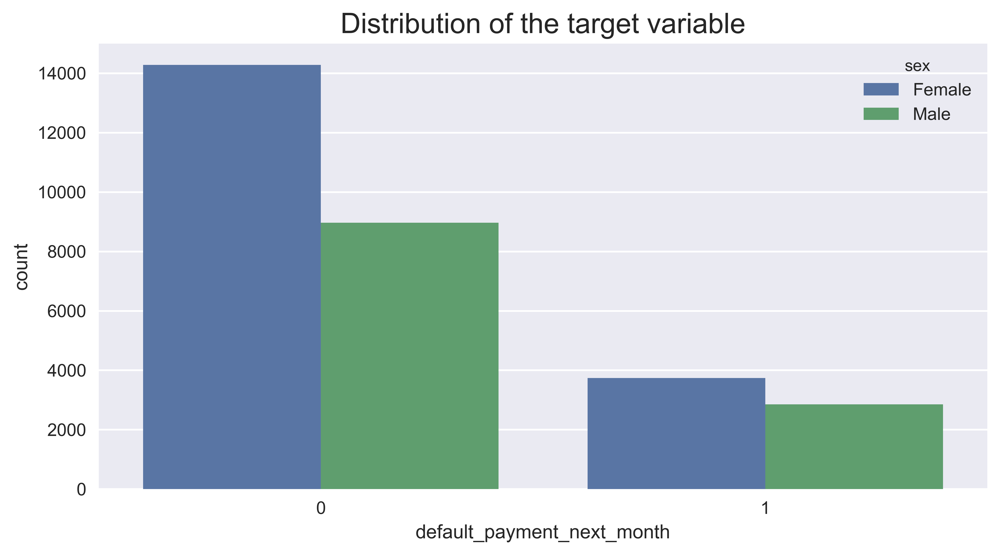

In [29]:
ax = sns.countplot('default_payment_next_month', hue='sex', 
                   data=df, orient='h')
ax.set_title('Distribution of the target variable', fontsize=16)

plt.tight_layout()
# plt.savefig('images/ch8_im9.png')
plt.show()

9. Investigate the percentage of defaults per education level:

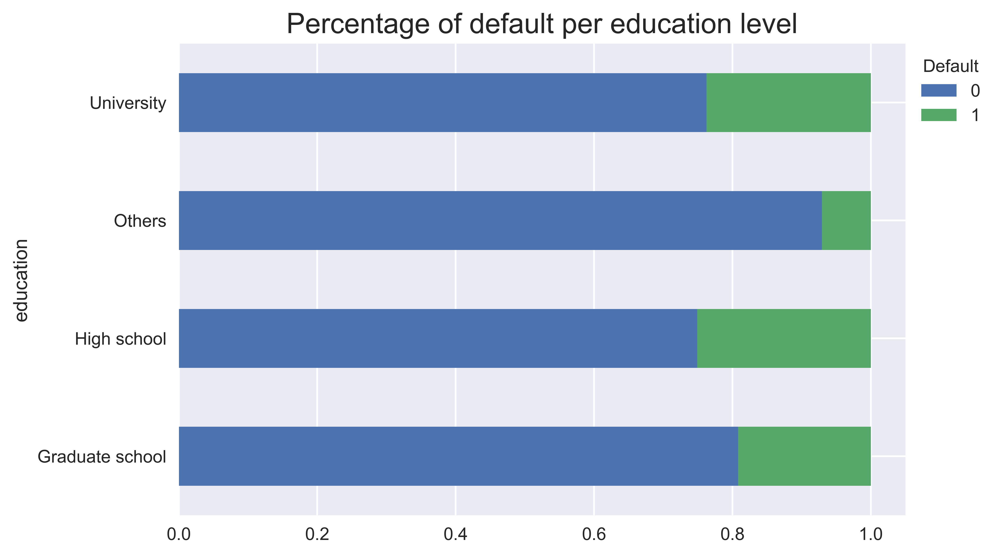

In [30]:
ax = df.groupby('education')['default_payment_next_month'] \
       .value_counts(normalize=True) \
       .unstack() \
       .plot(kind='barh', stacked='True')
ax.set_title('Percentage of default per education level', 
             fontsize=16)
ax.legend(title='Default', bbox_to_anchor=(1,1)) 

plt.tight_layout()
# plt.savefig('images/ch8_im10.png')
plt.show()

### There's more

In [ ]:
# import pandas_profiling
# df.profile_report()

## Splitting the data into training and test sets

### How to do it...

1. Import the function from `sklearn`:

In [15]:
from sklearn.model_selection import train_test_split

2. Split the data into training and test sets:

In [22]:
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=0.2, 
                                                    random_state=42)

3. Split the data into training and test sets without shuffling:

In [23]:
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=0.2, 
                                                    shuffle=False)

4. Split the data into training and test sets with stratification:

In [16]:
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=0.2, 
                                                    stratify=y, 
                                                    random_state=42)

5. Verify that the ratio of the target is preserved:

In [25]:
y_train.value_counts(normalize=True)

0    0.778792
1    0.221208
Name: default_payment_next_month, dtype: float64

In [26]:
y_test.value_counts(normalize=True)

0    0.778833
1    0.221167
Name: default_payment_next_month, dtype: float64

### There's more

In [27]:
# # define the size of the validation and test sets
# VALID_SIZE = 0.1
# TEST_SIZE = 0.2

# # create the initial split - training and temp
# X_train, X_temp, y_train, y_temp = train_test_split(X, y, 
#                                                     test_size=(VALID_SIZE + TEST_SIZE), 
#                                                     stratify=y, 
#                                                     random_state=42)

# # calculate the new test size
# NEW_TEST_SIZE = np.around(TEST_SIZE / (VALID_SIZE + TEST_SIZE), 2)

# # create the valid and test sets
# X_valid, X_test, y_valid, y_test = train_test_split(X_temp, y_temp, 
#                                                     test_size=NEW_TEST_SIZE, 
#                                                     stratify=y_temp, 
#                                                     random_state=42)

## Dealing with missing values

### How to do it...

1. Import the libraries:

In [17]:
import pandas as pd 
import missingno
from sklearn.impute import SimpleImputer

2. Inspect the information about the DataFrame:

In [18]:
X.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 30000 entries, 0 to 29999
Data columns (total 23 columns):
limit_bal               30000 non-null int64
sex                     29850 non-null object
education               29850 non-null object
marriage                29850 non-null object
age                     29850 non-null float64
payment_status_sep      30000 non-null object
payment_status_aug      30000 non-null object
payment_status_jul      30000 non-null object
payment_status_jun      30000 non-null object
payment_status_may      30000 non-null object
payment_status_apr      30000 non-null object
bill_statement_sep      30000 non-null int64
bill_statement_aug      30000 non-null int64
bill_statement_jul      30000 non-null int64
bill_statement_jun      30000 non-null int64
bill_statement_may      30000 non-null int64
bill_statement_apr      30000 non-null int64
previous_payment_sep    30000 non-null int64
previous_payment_aug    30000 non-null int64
previous_payment_jul    3

3. Visualize the nullity of the DataFrame:

In [19]:
missingno.matrix(X)

# plt.savefig('images/ch8_im12.png')
plt.show()

4. Define columns with missing values per data type:

In [20]:
NUM_FEATURES = ['age']
CAT_FEATURES = ['sex', 'education', 'marriage']

5. Impute the numerical feature:

In [21]:
for col in NUM_FEATURES:
    num_imputer = SimpleImputer(strategy='median')
    num_imputer.fit(X_train[[col]])
    X_train.loc[:, col] = num_imputer.transform(X_train[[col]])
    X_test.loc[:, col] = num_imputer.transform(X_test[[col]])

/Users/eryklewinson/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:494: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s
/Users/eryklewinson/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:494: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


In [22]:
# alternative method using pandas

# for feature in NUM_FEATURES:
#     median_value = X_train[feature].median()
#     X_train.loc[:, feature].fillna(median_value, inplace=True)
#     X_test.loc[:, feature].fillna(median_value, inplace=True)

6. Impute the categorical features:

In [23]:
for col in CAT_FEATURES:
    cat_imputer = SimpleImputer(strategy='most_frequent')
    cat_imputer.fit(X_train[[col]])
    X_train.loc[:, col] = cat_imputer.transform(X_train[[col]])
    X_test.loc[:, col] = cat_imputer.transform(X_test[[col]])

/Users/eryklewinson/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:494: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s
/Users/eryklewinson/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:494: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s
/Users/eryklewinson/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:494: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_

In [24]:
# alternative method using pandas

# for feature in CAT_FEATURES:
#     mode_value = X_train[feature].mode().values[0]
#     X_train.loc[:, feature].fillna(mode_value, inplace=True)
#     X_test.loc[:, feature].fillna(mode_value, inplace=True)

7. Verify that there are no missing values:

In [25]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 24000 entries, 22788 to 27126
Data columns (total 23 columns):
limit_bal               24000 non-null int64
sex                     24000 non-null object
education               24000 non-null object
marriage                24000 non-null object
age                     24000 non-null float64
payment_status_sep      24000 non-null object
payment_status_aug      24000 non-null object
payment_status_jul      24000 non-null object
payment_status_jun      24000 non-null object
payment_status_may      24000 non-null object
payment_status_apr      24000 non-null object
bill_statement_sep      24000 non-null int64
bill_statement_aug      24000 non-null int64
bill_statement_jul      24000 non-null int64
bill_statement_jun      24000 non-null int64
bill_statement_may      24000 non-null int64
bill_statement_apr      24000 non-null int64
previous_payment_sep    24000 non-null int64
previous_payment_aug    24000 non-null int64
previous_payment_jul 

## Encoding categorical variables

### How to do it...

1. Import the libraries:

In [34]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.compose import ColumnTransformer

2. Use Label Encoder to encode a selected column:

In [35]:
COL = 'education'

X_train_copy = X_train.copy()
X_test_copy = X_test.copy()

label_encoder = LabelEncoder()
label_encoder.fit(X_train_copy[COL])
X_train_copy.loc[:, COL] = label_encoder.transform(X_train_copy[COL])
X_test_copy.loc[:, COL] = label_encoder.transform(X_test_copy[COL])

3. Select categorical features for one-hot encoding:

In [36]:
CAT_FEATURES = X_train.select_dtypes(include='object') \
                      .columns \
                      .to_list()

4. Instantiate the One-Hot Encoder object:

In [37]:
one_hot_encoder = OneHotEncoder(sparse=False, 
                                handle_unknown='error', 
                                drop='first')

5. Create the column transformer using the one-hot encoder: 

In [38]:
one_hot_transformer = ColumnTransformer(
    [("one_hot", one_hot_encoder, CAT_FEATURES)]
    #,remainder='passthrough'
)

6. Fit the transformer:

In [39]:
one_hot_transformer.fit(X_train)

ColumnTransformer(n_jobs=None, remainder='drop', sparse_threshold=0.3,
                  transformer_weights=None,
                  transformers=[('one_hot',
                                 OneHotEncoder(categories='auto', drop='first',
                                               dtype=<class 'numpy.float64'>,
                                               handle_unknown='error',
                                               sparse=False),
                                 ['sex', 'education', 'marriage',
                                  'payment_status_sep', 'payment_status_aug',
                                  'payment_status_jul', 'payment_status_jun',
                                  'payment_status_may',
                                  'payment_status_apr'])],
                  verbose=False)

7. Apply the transformations to both training and test sets:

In [40]:
col_names = one_hot_transformer.get_feature_names()

X_train_cat = pd.DataFrame(one_hot_transformer.transform(X_train), 
                           columns=col_names, 
                           index=X_train.index)
X_train_ohe = pd.concat([X_train, X_train_cat], axis=1) \
                .drop(CAT_FEATURES, axis=1)

X_test_cat = pd.DataFrame(one_hot_transformer.transform(X_test), 
                          columns=col_names, 
                          index=X_test.index)
X_test_ohe = pd.concat([X_test, X_test_cat], axis=1) \
               .drop(CAT_FEATURES, axis=1)

### There's more

#### Using `pandas.get_dummies` for one-hot encoding

In [53]:
pd.get_dummies(X_train, prefix_sep='_', drop_first=True)

,limit_bal,age,bill_statement_sep,bill_statement_aug,bill_statement_jul,bill_statement_jun,bill_statement_may,bill_statement_apr,previous_payment_sep,previous_payment_aug,...,payment_status_may_Payment delayed 8 months,payment_status_may_Unknown,payment_status_apr_Payment delayed 2 months,payment_status_apr_Payment delayed 3 months,payment_status_apr_Payment delayed 4 months,payment_status_apr_Payment delayed 5 months,payment_status_apr_Payment delayed 6 months,payment_status_apr_Payment delayed 7 months,payment_status_apr_Payment delayed 8 months,payment_status_apr_Unknown
22788,160000,33.0,161771,172632,168541,164310,162681,163005,15000,0,...,0,1,0,0,0,0,0,0,0,1
29006,150000,34.0,0,53,0,0,0,0,53,0,...,0,1,0,0,0,0,0,0,0,1
16950,10000,50.0,10171,8150,8446,8067,8227,8400,2,1281,...,0,1,0,0,0,0,0,0,0,1
22280,220000,29.0,206879,211037,215139,218513,131660,134346,9100,9000,...,0,1,0,0,0,0,0,0,0,1
11346,310000,32.0,0,0,326,326,-235,-235,0,326,...,0,1,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23479,100000,31.0,91344,92309,94421,97486,97604,97241,3309,4421,...,0,1,0,0,0,0,0,0,0,1
13921,120000,24.0,112336,113351,115515,113948,122127,121962,4200,4100,...,0,1,1,0,0,0,0,0,0,0
3794,120000,24.0,75796,76004,67187,49924,33188,19826,3700,2023,...,0,1,0,0,0,0,0,0,0,1
27565,360000,57.0,0,0,860,246,-46,-46,0,860,...,0,0,0,0,0,0,0,0,0,1


#### Specifying possible categories for OneHotEncoder

In [54]:
one_hot_encoder = OneHotEncoder(categories=[['Male', 'Female', 
                                             'Unknown']], 
                                sparse=False, 
                                handle_unknown='error', 
                                drop='first')

one_hot_transformer = ColumnTransformer(
    [("one_hot", one_hot_encoder, ['sex'])]
)

one_hot_transformer.fit(X_train)
one_hot_transformer.get_feature_names()

['one_hot__x0_Female', 'one_hot__x0_Unknown']

#### Category Encoders library

In [55]:
import category_encoders as ce

In [56]:
one_hot_encoder_ce = ce.OneHotEncoder(use_cat_names=True)

In [57]:
one_hot_encoder_ce.fit(X_train)
X_train_ce = one_hot_encoder_ce.transform(X_train)
X_train_ce.head()

,limit_bal,sex_Female,sex_Male,education_University,education_Graduate school,education_High school,education_Others,marriage_Single,marriage_Married,marriage_Others,...,bill_statement_jul,bill_statement_jun,bill_statement_may,bill_statement_apr,previous_payment_sep,previous_payment_aug,previous_payment_jul,previous_payment_jun,previous_payment_may,previous_payment_apr
22788,160000,1,0,1,0,0,0,1,0,0,...,168541,164310,162681,163005,15000,0,0,6100,12300,6100
29006,150000,1,0,0,1,0,0,1,0,0,...,0,0,0,0,53,0,0,0,0,0
16950,10000,0,1,1,0,0,0,0,1,0,...,8446,8067,8227,8400,2,1281,1134,294,305,1000
22280,220000,1,0,0,1,0,0,1,0,0,...,215139,218513,131660,134346,9100,9000,7887,4800,4900,6000
11346,310000,1,0,0,1,0,0,1,0,0,...,326,326,-235,-235,0,326,0,0,0,1200


In [58]:
target_encoder = ce.TargetEncoder(smoothing=0)
target_encoder.fit(X_train.sex, y_train)
target_encoder.transform(X_train.sex).head()

,sex
22788,0.206563
29006,0.206563
16950,0.243825
22280,0.206563
11346,0.206563


## Fitting a decision tree classifier

### How to do it...

1. Import the libraries:

In [41]:
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn import metrics

from chapter_8_utils import performance_evaluation_report

from io import StringIO
import seaborn as sns
from ipywidgets import Image
import pydotplus 


2. Create the instance of the model, fit it to the training data and create prediction:

In [42]:
tree_classifier = DecisionTreeClassifier(random_state=42)
tree_classifier.fit(X_train_ohe, y_train)
y_pred = tree_classifier.predict(X_test_ohe)

3. Evaluate the results:

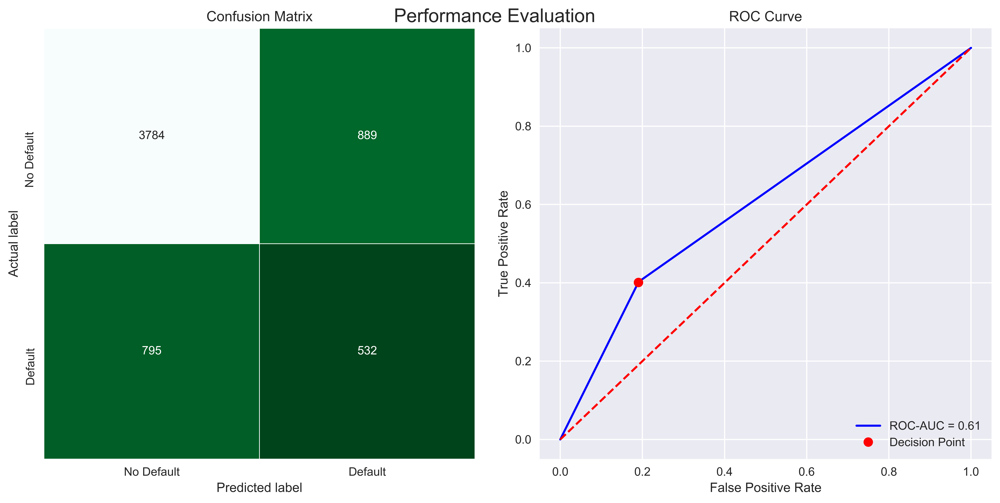

In [43]:
LABELS = ['No Default', 'Default']
tree_perf = performance_evaluation_report(tree_classifier, 
                                          X_test_ohe, 
                                          y_test, labels=LABELS, 
                                          show_plot=True)

plt.tight_layout()
# plt.savefig('images/ch8_im14.png')
plt.show()

In [44]:
tree_perf

{'accuracy': 0.7193333333333334,
 'precision': 0.37438423645320196,
 'recall': 0.400904295403165,
 'specificity': 0.8097581853199229,
 'f1_score': 0.38719068413391555,
 'cohens_kappa': 0.20545212086249653,
 'roc_auc': 0.6059202515178426,
 'pr_auc': 0.4542470275794692}

4. Plot the simplified Decision Tree:

In [66]:
small_tree = DecisionTreeClassifier(max_depth=3, 
                                    random_state=42)
small_tree.fit(X_train_ohe, y_train)

tree_dot = StringIO()
export_graphviz(small_tree, feature_names=X_train_ohe.columns,
                class_names=LABELS, rounded=True, out_file=tree_dot,
                proportion=False, precision=2, filled=True)
tree_graph = pydotplus.graph_from_dot_data(tree_dot.getvalue())  
tree_graph.set_dpi(300) 
# tree_graph.write_png('images/ch8_im15.png')
Image(value=tree_graph.create_png())

Image(value=b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x14N\x00\x00\x06\xbd\x08\x06\x00\x00\x00`S\xc9\xd9\x…

### There's more

In [45]:
y_pred_prob = tree_classifier.predict_proba(X_test_ohe)[:, 1]

In [46]:
precision, recall, thresholds = metrics.precision_recall_curve(y_test, 
                                                               y_pred_prob)

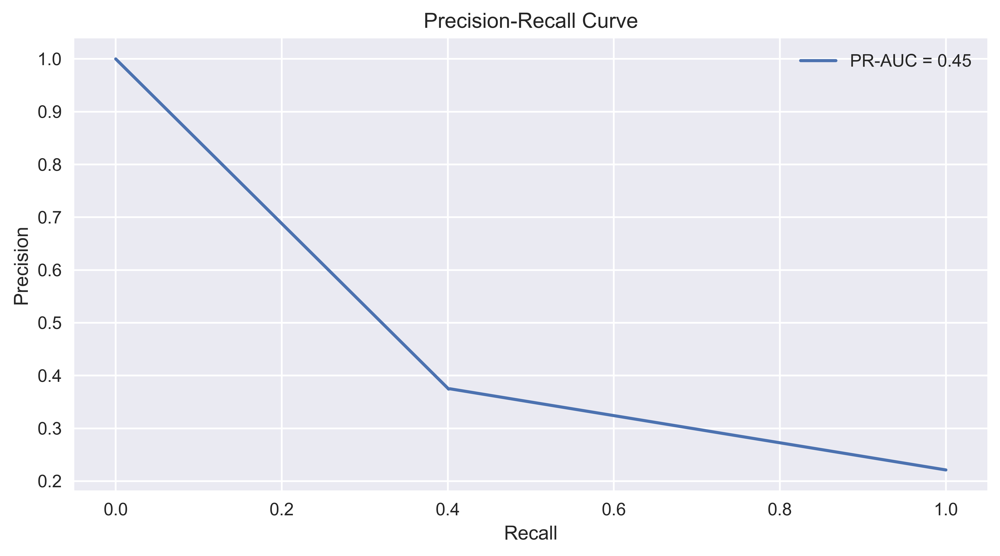

In [47]:
ax = plt.subplot()
ax.plot(recall, precision, 
        label=f'PR-AUC = {metrics.auc(recall, precision):.2f}')
ax.set(title='Precision-Recall Curve', 
       xlabel='Recall', 
       ylabel='Precision')
ax.legend()

plt.tight_layout()
# plt.savefig('images/ch8_im16.png')
plt.show()

## Implementing scikit-learn's pipelines

### How to do it...

1. Import the libraries:

In [3]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.tree import DecisionTreeClassifier
from sklearn.pipeline import Pipeline
from chapter_8_utils import performance_evaluation_report

2. Load the data, separate the target and create the stratified train-test split:

In [4]:
df = pd.read_csv('credit_card_default.csv', index_col=0, 
                 na_values='')

X = df.copy()
y = X.pop('default_payment_next_month')

X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=0.2, 
                                                    stratify=y, 
                                                    random_state=42)

3. Store lists of numerical/categorical features:

In [5]:
num_features = X_train.select_dtypes(include='number') \
                      .columns \
                      .to_list()
cat_features = X_train.select_dtypes(include='object') \
                      .columns \
                      .to_list()

4. Define the numerical pipeline:

In [6]:
num_pipeline = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median'))
])

5. Define the categorical pipeline:

In [7]:
cat_list = [list(X_train[col].dropna().unique()) for col in cat_features]

cat_pipeline = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(categories=cat_list, sparse=False, 
                             handle_unknown='error', drop='first'))
])

6. Define the column transformer object:

In [8]:
preprocessor = ColumnTransformer(transformers=[
    ('numerical', num_pipeline, num_features),
    ('categorical', cat_pipeline, cat_features)],
    remainder='drop')

7. Create the joint pipeline:

In [9]:
dec_tree = DecisionTreeClassifier(random_state=42)

tree_pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                                ('classifier', dec_tree)])

8. Fit the pipeline to the data:

In [10]:
tree_pipeline.fit(X_train, y_train)

Pipeline(memory=None,
         steps=[('preprocessor',
                 ColumnTransformer(n_jobs=None, remainder='drop',
                                   sparse_threshold=0.3,
                                   transformer_weights=None,
                                   transformers=[('numerical',
                                                  Pipeline(memory=None,
                                                           steps=[('imputer',
                                                                   SimpleImputer(add_indicator=False,
                                                                                 copy=True,
                                                                                 fill_value=None,
                                                                                 missing_values=nan,
                                                                                 strategy='median',
                                                       

9. Evaluate the performance of the entire pipeline:

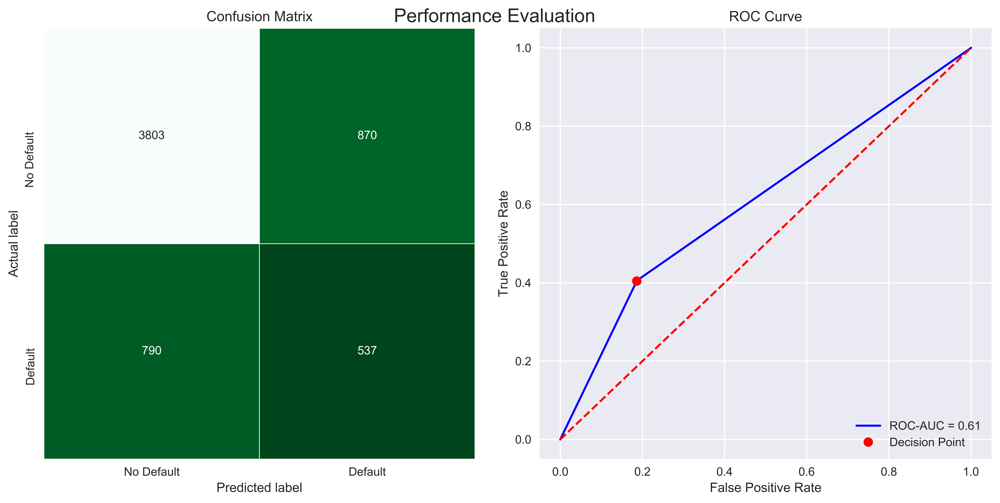

In [11]:
LABELS = ['No Default', 'Default']
tree_perf = performance_evaluation_report(tree_pipeline, X_test, 
                                          y_test, labels=LABELS, 
                                          show_plot=True)

plt.tight_layout()
# plt.savefig('images/ch8_im17.png')
plt.show()

In [12]:
tree_perf

{'accuracy': 0.7233333333333334,
 'precision': 0.3816631130063966,
 'recall': 0.4046721929163527,
 'specificity': 0.8138240958698909,
 'f1_score': 0.3928310168251646,
 'cohens_kappa': 0.21388003714653614,
 'roc_auc': 0.6095279347712678,
 'pr_auc': 0.4589251149708047}

### There's more

1. Import the base estimator and transformer from `sklearn`:

In [13]:
from sklearn.base import BaseEstimator, TransformerMixin

2. Define the `OutlierRemover` class:

In [14]:
class OutlierRemover(BaseEstimator, TransformerMixin):
    def __init__(self, n_std=3):
        self.n_std = n_std
    
    def fit(self, X, y = None):
        if np.isnan(X).any(axis=None):
            raise ValueError('''There are missing values in the array! 
                                Please remove them.''')

        mean_vec = np.mean(X, axis=0)
        std_vec = np.std(X, axis=0)
        
        self.upper_band_ = mean_vec + self.n_std * std_vec
        self.lower_band_ = mean_vec - self.n_std * std_vec
        self.n_features_ = len(self.upper_band_)
        
        return self 
    
    def transform(self, X, y = None):
        X_copy = pd.DataFrame(X.copy())
        
        upper_band = np.repeat(self.upper_band_.reshape(self.n_features_, 
                                                        -1), 
                               len(X_copy), 
                               axis=1).transpose()
        lower_band = np.repeat(self.lower_band_.reshape(self.n_features_, 
                                                        -1), 
                               len(X_copy), 
                               axis=1).transpose()
        
        X_copy[X_copy >= upper_band] = upper_band
        X_copy[X_copy <= lower_band] = lower_band
        
        return X_copy.values

3. Add the `OutlierRemover` to the numerical Pipeline:

In [15]:
num_pipeline = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('outliers', OutlierRemover())
])

4. Run the rest of the Pipeline, to compare the results:

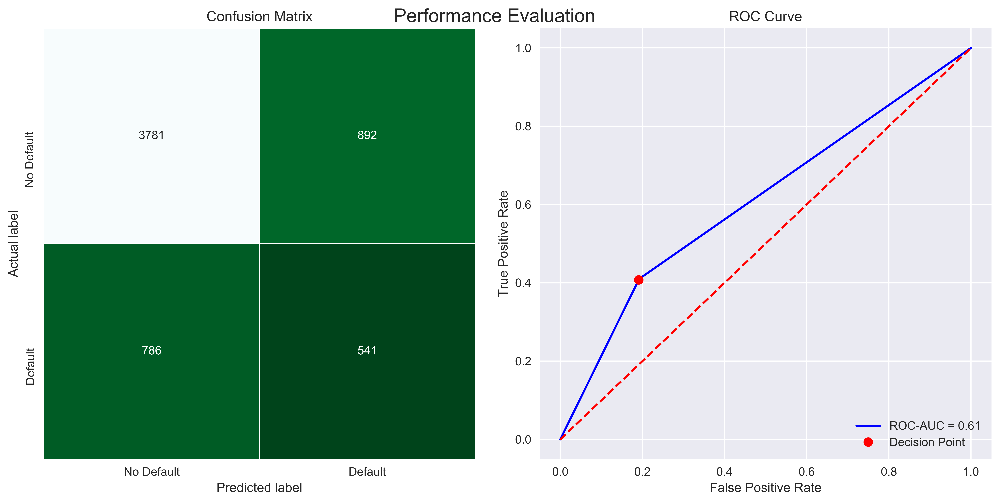

In [16]:
preprocessor = ColumnTransformer(transformers=[
    ('numerical', num_pipeline, num_features),
    ('categorical', cat_pipeline, cat_features)],
    remainder='drop')

dec_tree = DecisionTreeClassifier(random_state=42)

tree_pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                                ('classifier', dec_tree)])

tree_pipeline.fit(X_train, y_train)

tree_perf = performance_evaluation_report(tree_pipeline, X_test, 
                                          y_test, labels=LABELS, 
                                          show_plot=True)

plt.tight_layout()
# plt.savefig('images/ch8_im18.png')
plt.show()

In [17]:
tree_perf

{'accuracy': 0.7203333333333334,
 'precision': 0.377529658060014,
 'recall': 0.4076865109269028,
 'specificity': 0.8091161994436122,
 'f1_score': 0.39202898550724635,
 'cohens_kappa': 0.21077497538963086,
 'roc_auc': 0.608982787005664,
 'pr_auc': 0.4582134167657523}

## Tuning hyperparameters using grid search and cross-validation

### How to do it...

1. Import the libraries:

In [18]:
from sklearn.model_selection import (GridSearchCV, cross_val_score, 
                                     RandomizedSearchCV, cross_validate, 
                                     StratifiedKFold)
from sklearn import metrics

2. Define the cross-validation scheme:

In [19]:
k_fold = StratifiedKFold(5, shuffle=True, random_state=42)

3. Evaluate the pipeline using cross-validation:

In [20]:
cross_val_score(tree_pipeline, X_train, y_train, cv=k_fold)

array([0.72333333, 0.72958333, 0.71375   , 0.723125  , 0.72      ])

4. Add extra metrics to cross-validation:

In [21]:
cross_validate(tree_pipeline, X_train, y_train, cv=k_fold, 
               scoring=['accuracy', 'precision', 'recall', 
                        'roc_auc'])

{'fit_time': array([1.25873828, 1.22295809, 1.12167883, 1.0772078 , 1.02375579]),
 'score_time': array([0.0637238 , 0.06849694, 0.0613749 , 0.05723   , 0.0555172 ]),
 'test_accuracy': array([0.72333333, 0.72958333, 0.71375   , 0.723125  , 0.72      ]),
 'test_precision': array([0.38560411, 0.39557522, 0.36978297, 0.38638298, 0.37674825]),
 'test_recall': array([0.42412818, 0.42090395, 0.41713748, 0.42749529, 0.40583804]),
 'test_roc_auc': array([0.61633282, 0.61893804, 0.60794039, 0.61806569, 0.60712913])}

5. Define the parameter grid:

In [22]:
param_grid = {'classifier__criterion': ['entropy', 'gini'],
              'classifier__max_depth': range(3, 11),
              'classifier__min_samples_leaf': range(2, 11), 
              'preprocessor__numerical__outliers__n_std': [3, 4]}

6. Run Grid Search:

In [23]:
classifier_gs = GridSearchCV(tree_pipeline, param_grid, scoring='recall', 
                             cv=k_fold, n_jobs=-1, verbose=1)

classifier_gs.fit(X_train, y_train)

Fitting 5 folds for each of 288 candidates, totalling 1440 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:   11.8s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:   51.0s
[Parallel(n_jobs=-1)]: Done 434 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 784 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 1234 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 1440 out of 1440 | elapsed:  6.5min finished


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             error_score=nan,
             estimator=Pipeline(memory=None,
                                steps=[('preprocessor',
                                        ColumnTransformer(n_jobs=None,
                                                          remainder='drop',
                                                          sparse_threshold=0.3,
                                                          transformer_weights=None,
                                                          transformers=[('numerical',
                                                                         Pipeline(memory=None,
                                                                                  steps=[('imputer',
                                                                                          SimpleImputer(add_indicator=False,
                                                                           

In [24]:
print(f'Best parameters: {classifier_gs.best_params_}') 
print(f'Recall (Training set): {classifier_gs.best_score_:.4f}') 
print(f'Recall (Test set): {metrics.recall_score(y_test, classifier_gs.predict(X_test)):.4f}')

Best parameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 10, 'classifier__min_samples_leaf': 7, 'preprocessor__numerical__outliers__n_std': 4}
Recall (Training set): 0.3858
Recall (Test set): 0.3775


7. Evaluate the performance of the Grid Search:

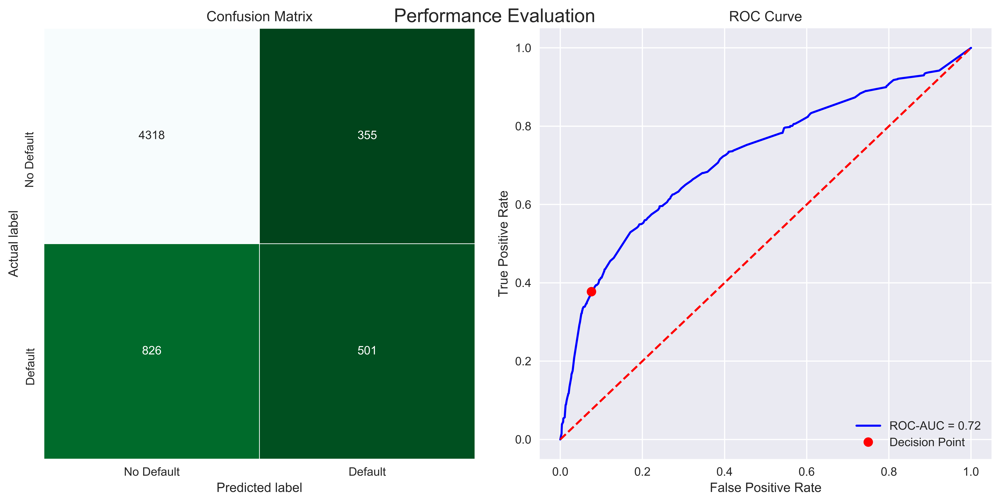

In [35]:
LABELS = ['No Default', 'Default']
tree_gs_perf = performance_evaluation_report(classifier_gs, X_test, 
                                             y_test, labels=LABELS, 
                                             show_plot=True)

plt.tight_layout()
plt.savefig('images/ch8_im20.png')
plt.show()

In [26]:
tree_gs_perf

{'accuracy': 0.8031666666666667,
 'precision': 0.5852803738317757,
 'recall': 0.3775433308214017,
 'specificity': 0.9240316713032314,
 'f1_score': 0.45900137425561155,
 'cohens_kappa': 0.34547526291831954,
 'roc_auc': 0.7205480311384921,
 'pr_auc': 0.4698784893189859}

8. Run Randomized Grid Search:

In [31]:
classifier_rs = RandomizedSearchCV(tree_pipeline, param_grid, scoring='recall', 
                                   cv=k_fold, n_jobs=-1, verbose=1, 
                                   n_iter=100, random_state=42)
classifier_rs.fit(X_train, y_train)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:   11.0s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:   48.3s
[Parallel(n_jobs=-1)]: Done 434 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed:  2.1min finished


RandomizedSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
                   error_score=nan,
                   estimator=Pipeline(memory=None,
                                      steps=[('preprocessor',
                                              ColumnTransformer(n_jobs=None,
                                                                remainder='drop',
                                                                sparse_threshold=0.3,
                                                                transformer_weights=None,
                                                                transformers=[('numerical',
                                                                               Pipeline(memory=None,
                                                                                        steps=[('imputer',
                                                                                                SimpleImputer(add_indicator=False,
   

In [32]:
print(f'Best parameters: {classifier_rs.best_params_}') 
print(f'Recall (Training set): {classifier_rs.best_score_:.4f}') 
print(f'Recall (Test set): {metrics.recall_score(y_test, classifier_rs.predict(X_test)):.4f}')

Best parameters: {'preprocessor__numerical__outliers__n_std': 3, 'classifier__min_samples_leaf': 7, 'classifier__max_depth': 10, 'classifier__criterion': 'gini'}
Recall (Training set): 0.3854
Recall (Test set): 0.3760


9. Evaluate the performance of the Randomized Grid Search:

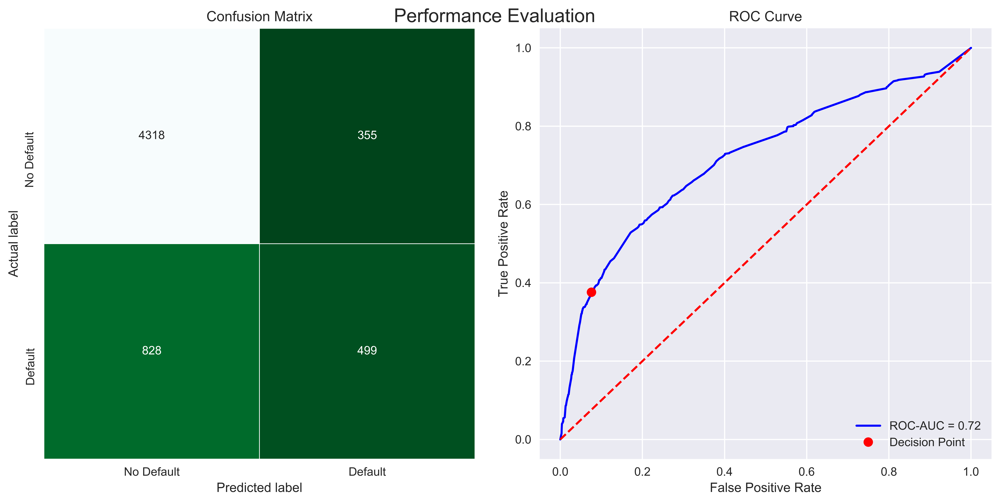

In [36]:
tree_rs_perf = performance_evaluation_report(classifier_rs, X_test, 
                                             y_test, labels=LABELS, 
                                             show_plot=True)

plt.tight_layout()
plt.savefig('images/ch8_im21.png')
plt.show()

In [34]:
tree_rs_perf

{'accuracy': 0.8028333333333333,
 'precision': 0.5843091334894613,
 'recall': 0.3760361718161266,
 'specificity': 0.9240316713032314,
 'f1_score': 0.45758826226501603,
 'cohens_kappa': 0.3439613201516819,
 'roc_auc': 0.7188330048148133,
 'pr_auc': 0.4686663337519278}

### There's more

In [39]:
from sklearn.linear_model import LogisticRegression

In [40]:
param_grid = [{'classifier': [LogisticRegression()],
               'classifier__penalty': ['l1', 'l2'],
               'classifier__C': np.logspace(0, 3, 10, 2),
               'preprocessor__numerical__outliers__n_std': [3, 4]},
              {'classifier': [DecisionTreeClassifier(random_state=42)],
               'classifier__criterion': ['entropy', 'gini'],
               'classifier__max_depth': range(3, 11),
               'classifier__min_samples_leaf': range(2, 11),
               'preprocessor__numerical__outliers__n_std': [3, 4]}]

In [41]:
classifier_gs_2 = GridSearchCV(tree_pipeline, param_grid, scoring='recall', 
                             cv=k_fold, n_jobs=-1, verbose=1)

classifier_gs_2.fit(X_train, y_train)

print(f'Best parameters: {classifier_gs_2.best_params_}') 
print(f'Recall (Training set): {classifier_gs_2.best_score_:.4f}') 
print(f'Recall (Test set): {metrics.recall_score(y_test, classifier_gs_2.predict(X_test)):.4f}')

Fitting 5 folds for each of 328 candidates, totalling 1640 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:   12.2s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:   49.4s
[Parallel(n_jobs=-1)]: Done 434 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 784 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 1234 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 1640 out of 1640 | elapsed:  7.6min finished


Best parameters: {'classifier': DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=10, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=7, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=42, splitter='best'), 'classifier__criterion': 'gini', 'classifier__max_depth': 10, 'classifier__min_samples_leaf': 7, 'preprocessor__numerical__outliers__n_std': 4}
Recall (Training set): 0.3858
Recall (Test set): 0.3775
